# Exoplanet Classifier

For this project, our main goal is to create a classifier that can predict exoplanets from existing kepler data. The current datset was obtained through Kaggle (https://www.kaggle.com/nasa/kepler-exoplanet-search-results) as a csv file, where the original data was extracted from NASA's exoplanet archieve (https://exoplanetarchive.ipac.caltech.edu/docs/API_kepcandidate_columns.html). Several different classifiers will be trained and tested from existing data and the best one will be chosen to predict which candidate planets would be true exoplanets.

In [1]:
# Importing Dependencies
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [2]:
# Generating path to dataset file
curr_dir = os.getcwd()
main_dir = os.path.dirname(curr_dir)
datasets_dir = os.path.join(main_dir, "datasets")
dataset_files = os.listdir(datasets_dir)
files = []
for file in dataset_files:
    files.append(os.path.join(datasets_dir, file))

In [3]:
# Loading dataset onto DataFrame
dataframes = []
for file in files:
    dataframes.append(pd.read_csv(file))

df = dataframes[0]
df.head()

,rowid,kepid,kepoi_name,kepler_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
0,1,10797460,K00752.01,Kepler-227 b,CONFIRMED,CANDIDATE,1.000,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
1,2,10797460,K00752.02,Kepler-227 c,CONFIRMED,CANDIDATE,0.969,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
2,3,10811496,K00753.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,...,-176.0,4.544,0.044,-0.176,0.868,0.233,-0.078,297.00482,48.134129,15.436
3,4,10848459,K00754.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,...,-174.0,4.564,0.053,-0.168,0.791,0.201,-0.067,285.53461,48.285210,15.597
4,5,10854555,K00755.01,Kepler-664 b,CONFIRMED,CANDIDATE,1.000,0,0,0,...,-211.0,4.438,0.070,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9564 entries, 0 to 9563
Data columns (total 50 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   rowid              9564 non-null   int64  
 1   kepid              9564 non-null   int64  
 2   kepoi_name         9564 non-null   object 
 3   kepler_name        2294 non-null   object 
 4   koi_disposition    9564 non-null   object 
 5   koi_pdisposition   9564 non-null   object 
 6   koi_score          8054 non-null   float64
 7   koi_fpflag_nt      9564 non-null   int64  
 8   koi_fpflag_ss      9564 non-null   int64  
 9   koi_fpflag_co      9564 non-null   int64  
 10  koi_fpflag_ec      9564 non-null   int64  
 11  koi_period         9564 non-null   float64
 12  koi_period_err1    9110 non-null   float64
 13  koi_period_err2    9110 non-null   float64
 14  koi_time0bk        9564 non-null   float64
 15  koi_time0bk_err1   9110 non-null   float64
 16  koi_time0bk_err2   9110 

In [6]:
# Checking number of columns in dataset
print("Number of columns:", len(list(df.columns)))

Number of columns: 50


In [7]:
# Checking object dtypes that are not unique names
print("koi_disposition types:", df['koi_disposition'].unique())
print("koi_pdisposition types:", df['koi_pdisposition'].unique())
print("koi_tce_delivname types:", df['koi_tce_delivname'].unique())

koi_disposition types: ['CONFIRMED' 'FALSE POSITIVE' 'CANDIDATE']
koi_pdisposition types: ['CANDIDATE' 'FALSE POSITIVE']
koi_tce_delivname types: ['q1_q17_dr25_tce' 'q1_q16_tce' nan 'q1_q17_dr24_tce']


The column "koi_disposition" is our main target for classification, separated into 'CONFIRMED', 'FALSE POSITIVE', and 'CANDIDATE'. "koi_pdisposition" appears to be a feature that might be useful to keep for our classifer, whereas "koi_tce_delivname" is a delivery name for TCE data federated to the KOI. We'll remove "koi_tce_delivname" along with any other extraneous columns that wouldn't impact on our classification results.

In [8]:
# Removing extraneous columns that wouldn't impact classification results and columns with 0 data
columns_to_drop = ['kepoi_name', 'kepler_name', 'koi_teq_err1', 'koi_teq_err2', 'koi_tce_delivname']
df.drop(columns_to_drop, axis='columns', inplace=True)

In [9]:
# We'll also remove uncertainty columns, focusing primarily on their main measurement columns
columns_to_drop_2 = [column for column in list(df.columns) if '_err' in column]
df.drop(columns_to_drop_2, axis='columns', inplace=True)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9564 entries, 0 to 9563
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rowid             9564 non-null   int64  
 1   kepid             9564 non-null   int64  
 2   koi_disposition   9564 non-null   object 
 3   koi_pdisposition  9564 non-null   object 
 4   koi_score         8054 non-null   float64
 5   koi_fpflag_nt     9564 non-null   int64  
 6   koi_fpflag_ss     9564 non-null   int64  
 7   koi_fpflag_co     9564 non-null   int64  
 8   koi_fpflag_ec     9564 non-null   int64  
 9   koi_period        9564 non-null   float64
 10  koi_time0bk       9564 non-null   float64
 11  koi_impact        9201 non-null   float64
 12  koi_duration      9564 non-null   float64
 13  koi_depth         9201 non-null   float64
 14  koi_prad          9201 non-null   float64
 15  koi_teq           9201 non-null   float64
 16  koi_insol         9243 non-null   float64


This leaves us with 25 remaining columns.

In [11]:
# Checking number of NaNs in dataset
df.isna().sum()

rowid                  0
kepid                  0
koi_disposition        0
koi_pdisposition       0
koi_score           1510
koi_fpflag_nt          0
koi_fpflag_ss          0
koi_fpflag_co          0
koi_fpflag_ec          0
koi_period             0
koi_time0bk            0
koi_impact           363
koi_duration           0
koi_depth            363
koi_prad             363
koi_teq              363
koi_insol            321
koi_model_snr        363
koi_tce_plnt_num     346
koi_steff            363
koi_slogg            363
koi_srad             363
ra                     0
dec                    0
koi_kepmag             1
dtype: int64

"koi_score" and many other descriptors here are important descriptors that indicates confidence of observation as well as stellar body's unique characteristics. Therefore we shouldn't impute these data. Instead, we'll drop the NaNs from our dataset.

In [12]:
# Dropping NaNs
df.dropna(inplace=True)

# Checking Remaining number of NaNs in dataset
df.isna().sum()

rowid               0
kepid               0
koi_disposition     0
koi_pdisposition    0
koi_score           0
koi_fpflag_nt       0
koi_fpflag_ss       0
koi_fpflag_co       0
koi_fpflag_ec       0
koi_period          0
koi_time0bk         0
koi_impact          0
koi_duration        0
koi_depth           0
koi_prad            0
koi_teq             0
koi_insol           0
koi_model_snr       0
koi_tce_plnt_num    0
koi_steff           0
koi_slogg           0
koi_srad            0
ra                  0
dec                 0
koi_kepmag          0
dtype: int64

In [13]:
df.head()

,rowid,kepid,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,...,koi_teq,koi_insol,koi_model_snr,koi_tce_plnt_num,koi_steff,koi_slogg,koi_srad,ra,dec,koi_kepmag
0,1,10797460,CONFIRMED,CANDIDATE,1.000,0,0,0,0,9.488036,...,793.0,93.59,35.8,1.0,5455.0,4.467,0.927,291.93423,48.141651,15.347
1,2,10797460,CONFIRMED,CANDIDATE,0.969,0,0,0,0,54.418383,...,443.0,9.11,25.8,2.0,5455.0,4.467,0.927,291.93423,48.141651,15.347
2,3,10811496,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,0,19.899140,...,638.0,39.30,76.3,1.0,5853.0,4.544,0.868,297.00482,48.134129,15.436
3,4,10848459,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,0,1.736952,...,1395.0,891.96,505.6,1.0,5805.0,4.564,0.791,285.53461,48.285210,15.597
4,5,10854555,CONFIRMED,CANDIDATE,1.000,0,0,0,0,2.525592,...,1406.0,926.16,40.9,1.0,6031.0,4.438,1.046,288.75488,48.226200,15.509


Looking at the first two rows, there does appear to be duplicates when it comes to our data. As to which duplicate we'll remove, we'll use the default settings from pandas.

In [14]:
# Dropping duplicates that share the same kepid, keeping only the first
df.drop_duplicates(subset=['kepid'], inplace=True)

In [15]:
df.head()

,rowid,kepid,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,...,koi_teq,koi_insol,koi_model_snr,koi_tce_plnt_num,koi_steff,koi_slogg,koi_srad,ra,dec,koi_kepmag
0,1,10797460,CONFIRMED,CANDIDATE,1.0,0,0,0,0,9.488036,...,793.0,93.59,35.8,1.0,5455.0,4.467,0.927,291.93423,48.141651,15.347
2,3,10811496,FALSE POSITIVE,FALSE POSITIVE,0.0,0,1,0,0,19.899140,...,638.0,39.30,76.3,1.0,5853.0,4.544,0.868,297.00482,48.134129,15.436
3,4,10848459,FALSE POSITIVE,FALSE POSITIVE,0.0,0,1,0,0,1.736952,...,1395.0,891.96,505.6,1.0,5805.0,4.564,0.791,285.53461,48.285210,15.597
4,5,10854555,CONFIRMED,CANDIDATE,1.0,0,0,0,0,2.525592,...,1406.0,926.16,40.9,1.0,6031.0,4.438,1.046,288.75488,48.226200,15.509
5,6,10872983,CONFIRMED,CANDIDATE,1.0,0,0,0,0,11.094321,...,835.0,114.81,66.5,1.0,6046.0,4.486,0.972,296.28613,48.224670,15.714


In [14]:
# Checking number of stellar bodies categorized in 'koi_disposition'
df['koi_disposition'].value_counts()

FALSE POSITIVE    3810
CONFIRMED         1588
CANDIDATE         1471
Name: koi_disposition, dtype: int64

Given that were are multiple identifications for our exoplanets, we'll drop the duplicate "rowid" column from our dataset.

In [16]:
# We'll use the kepid as our unique identifier, we'll drop rowid
df.drop('rowid', axis='columns', inplace=True)
# We'll also set kepid as our index
df.set_index('kepid', inplace=True)
df.head()

,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_time0bk,koi_impact,...,koi_teq,koi_insol,koi_model_snr,koi_tce_plnt_num,koi_steff,koi_slogg,koi_srad,ra,dec,koi_kepmag
kepid,,,,,,,,,,,,,,,,,,,,,
10797460,CONFIRMED,CANDIDATE,1.0,0,0,0,0,9.488036,170.538750,0.146,...,793.0,93.59,35.8,1.0,5455.0,4.467,0.927,291.93423,48.141651,15.347
10811496,FALSE POSITIVE,FALSE POSITIVE,0.0,0,1,0,0,19.899140,175.850252,0.969,...,638.0,39.30,76.3,1.0,5853.0,4.544,0.868,297.00482,48.134129,15.436
10848459,FALSE POSITIVE,FALSE POSITIVE,0.0,0,1,0,0,1.736952,170.307565,1.276,...,1395.0,891.96,505.6,1.0,5805.0,4.564,0.791,285.53461,48.285210,15.597
10854555,CONFIRMED,CANDIDATE,1.0,0,0,0,0,2.525592,171.595550,0.701,...,1406.0,926.16,40.9,1.0,6031.0,4.438,1.046,288.75488,48.226200,15.509
10872983,CONFIRMED,CANDIDATE,1.0,0,0,0,0,11.094321,171.201160,0.538,...,835.0,114.81,66.5,1.0,6046.0,4.486,0.972,296.28613,48.224670,15.714


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6869 entries, 10797460 to 10156110
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   koi_disposition   6869 non-null   object 
 1   koi_pdisposition  6869 non-null   object 
 2   koi_score         6869 non-null   float64
 3   koi_fpflag_nt     6869 non-null   int64  
 4   koi_fpflag_ss     6869 non-null   int64  
 5   koi_fpflag_co     6869 non-null   int64  
 6   koi_fpflag_ec     6869 non-null   int64  
 7   koi_period        6869 non-null   float64
 8   koi_time0bk       6869 non-null   float64
 9   koi_impact        6869 non-null   float64
 10  koi_duration      6869 non-null   float64
 11  koi_depth         6869 non-null   float64
 12  koi_prad          6869 non-null   float64
 13  koi_teq           6869 non-null   float64
 14  koi_insol         6869 non-null   float64
 15  koi_model_snr     6869 non-null   float64
 16  koi_tce_plnt_num  6869 non-null

In [18]:
df.shape

(6869, 23)

This gives us our final set of data with 6869 rows and 23 distinct columns, where "kepid" is now the row index.

Before we prepare our dataset for training, we'll explore our data a bit.

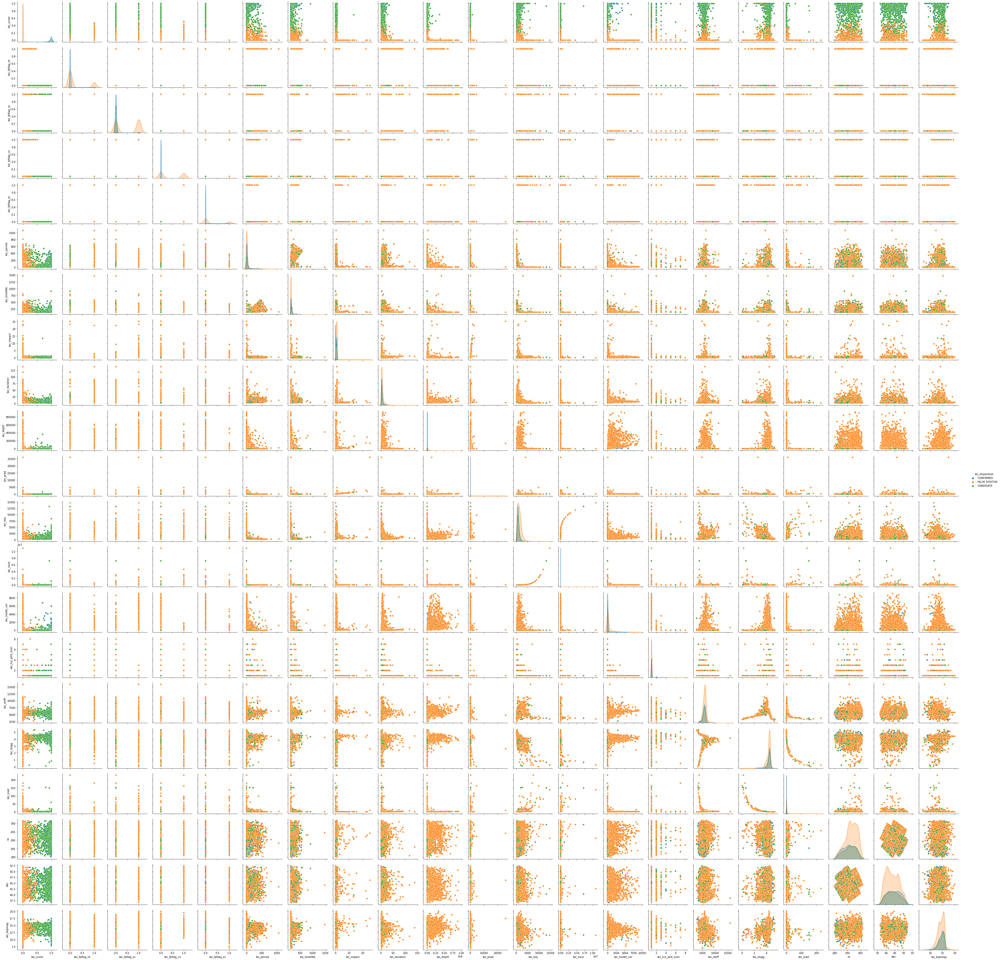

In [22]:
# Pairplot of dataset
sns.pairplot(df, hue='koi_disposition')
plt.show()

Looking at the pairplots, "koi_score" appears to be a decisive factor in determining whether or not an exoplanet is truly an exoplanet. This just goes to show how powerful existing Monte Carlo techniques can be when it comes to these predictions. But then again, it's likely that scientists and planet searchers are actively searching and reporting with very specific criterions to begin with. The classifiers we build would likely utilize "koi_score" to a significant degree.

To prepare our data for classification training, we'll first split up our categorical data (namely, "koi_disposition" and "koi_pdisposition") using pd.get_dummies. We'll also drop the last one-hot encoded column to avoid redundancy.

In [24]:
# We'll split up our categorical data using pd.get_dummies
categorical_columns = ['koi_disposition', 'koi_pdisposition']
other_columns = [column for column in list(df.columns) if column not in categorical_columns]

df = pd.concat([pd.get_dummies(df[categorical_columns], drop_first=True), df[other_columns]], axis=1)
df.head()

,koi_disposition_CONFIRMED,koi_disposition_FALSE POSITIVE,koi_pdisposition_FALSE POSITIVE,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_time0bk,...,koi_teq,koi_insol,koi_model_snr,koi_tce_plnt_num,koi_steff,koi_slogg,koi_srad,ra,dec,koi_kepmag
kepid,,,,,,,,,,,,,,,,,,,,,
10797460,1,0,0,1.0,0,0,0,0,9.488036,170.538750,...,793.0,93.59,35.8,1.0,5455.0,4.467,0.927,291.93423,48.141651,15.347
10811496,0,1,1,0.0,0,1,0,0,19.899140,175.850252,...,638.0,39.30,76.3,1.0,5853.0,4.544,0.868,297.00482,48.134129,15.436
10848459,0,1,1,0.0,0,1,0,0,1.736952,170.307565,...,1395.0,891.96,505.6,1.0,5805.0,4.564,0.791,285.53461,48.285210,15.597
10854555,1,0,0,1.0,0,0,0,0,2.525592,171.595550,...,1406.0,926.16,40.9,1.0,6031.0,4.438,1.046,288.75488,48.226200,15.509
10872983,1,0,0,1.0,0,0,0,0,11.094321,171.201160,...,835.0,114.81,66.5,1.0,6046.0,4.486,0.972,296.28613,48.224670,15.714


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6869 entries, 10797460 to 10156110
Data columns (total 24 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   koi_disposition_CONFIRMED        6869 non-null   uint8  
 1   koi_disposition_FALSE POSITIVE   6869 non-null   uint8  
 2   koi_pdisposition_FALSE POSITIVE  6869 non-null   uint8  
 3   koi_score                        6869 non-null   float64
 4   koi_fpflag_nt                    6869 non-null   int64  
 5   koi_fpflag_ss                    6869 non-null   int64  
 6   koi_fpflag_co                    6869 non-null   int64  
 7   koi_fpflag_ec                    6869 non-null   int64  
 8   koi_period                       6869 non-null   float64
 9   koi_time0bk                      6869 non-null   float64
 10  koi_impact                       6869 non-null   float64
 11  koi_duration                     6869 non-null   float64
 12  koi_depth

Considering the wide range of different numeric scaling, we'll normalize our numerical data using sklearn's Normalizer.

In [26]:
# We need to rescale our numerical data considering the plethora of
# ranges found in the data
from sklearn.preprocessing import Normalizer

floats_columns = [column for column in list(df.select_dtypes('float').columns)]

scaler = Normalizer()

transformed_floats = scaler.fit_transform(df.select_dtypes('float'))
transformed_floats_df = pd.DataFrame(transformed_floats, columns=floats_columns, index=list(df.index))
transformed_floats_df.head()

,koi_score,koi_period,koi_time0bk,koi_impact,koi_duration,koi_depth,koi_prad,koi_teq,koi_insol,koi_model_snr,koi_tce_plnt_num,koi_steff,koi_slogg,koi_srad,ra,dec,koi_kepmag
10797460,0.000180,0.001707,0.030683,0.000026,0.000532,0.110794,0.000407,0.142675,0.016839,0.006441,0.000180,0.981456,0.000804,0.000167,0.052524,0.008662,0.002761
10811496,0.000000,0.001614,0.014260,0.000079,0.000145,0.878170,0.001184,0.051738,0.003187,0.006187,0.000081,0.474645,0.000368,0.000070,0.024085,0.003903,0.001252
10848459,0.000000,0.000172,0.016856,0.000126,0.000238,0.799635,0.003312,0.138069,0.088281,0.050042,0.000099,0.574547,0.000452,0.000078,0.028261,0.004779,0.001544
10854555,0.000159,0.000401,0.027238,0.000111,0.000263,0.095764,0.000437,0.223178,0.147012,0.006492,0.000159,0.957318,0.000704,0.000166,0.045835,0.007655,0.002462
10872983,0.000159,0.001761,0.027174,0.000085,0.000729,0.240868,0.000619,0.132537,0.018223,0.010555,0.000159,0.959663,0.000712,0.000154,0.047029,0.007655,0.002494


We'll clean up and reform our dataset with integer columns in front and float columns in the back.

In [27]:
# Recombining our processed dataframes
ints_df = pd.concat([df.select_dtypes('uint8'), df.select_dtypes('int')], axis=1)
combined_df = pd.concat([ints_df, transformed_floats_df], axis=1)
combined_df.head()

,koi_disposition_CONFIRMED,koi_disposition_FALSE POSITIVE,koi_pdisposition_FALSE POSITIVE,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_score,koi_period,koi_time0bk,...,koi_teq,koi_insol,koi_model_snr,koi_tce_plnt_num,koi_steff,koi_slogg,koi_srad,ra,dec,koi_kepmag
10797460,1,0,0,0,0,0,0,0.000180,0.001707,0.030683,...,0.142675,0.016839,0.006441,0.000180,0.981456,0.000804,0.000167,0.052524,0.008662,0.002761
10811496,0,1,1,0,1,0,0,0.000000,0.001614,0.014260,...,0.051738,0.003187,0.006187,0.000081,0.474645,0.000368,0.000070,0.024085,0.003903,0.001252
10848459,0,1,1,0,1,0,0,0.000000,0.000172,0.016856,...,0.138069,0.088281,0.050042,0.000099,0.574547,0.000452,0.000078,0.028261,0.004779,0.001544
10854555,1,0,0,0,0,0,0,0.000159,0.000401,0.027238,...,0.223178,0.147012,0.006492,0.000159,0.957318,0.000704,0.000166,0.045835,0.007655,0.002462
10872983,1,0,0,0,0,0,0,0.000159,0.001761,0.027174,...,0.132537,0.018223,0.010555,0.000159,0.959663,0.000712,0.000154,0.047029,0.007655,0.002494


For our training, we'll separate those categorized as "CANDIDATES" from those categorized as "CONFIRMED" and "FALSE POSITIVE" before we split up our dataset for training and testing.

In [28]:
# Separating candidates from confirmed and false_positive results
# for training and testing
koi_disp_not_conf = combined_df['koi_disposition_CONFIRMED'] == 0
koi_disp_not_fal_pos = combined_df['koi_disposition_FALSE POSITIVE'] == 0

df_cand = combined_df[koi_disp_not_conf & koi_disp_not_fal_pos]
df_train_test = combined_df[~(koi_disp_not_conf & koi_disp_not_fal_pos)]

In [29]:
# There should be 1471 classified as 'CANDIDATES'
df_cand['koi_disposition_CONFIRMED'].value_counts()

0    1471
Name: koi_disposition_CONFIRMED, dtype: int64

In [30]:
# There should be 1588 'CONFIRMED' and 3810 'FALSE POSITIVE'
df_train_test['koi_disposition_CONFIRMED'].value_counts()

0    3810
1    1588
Name: koi_disposition_CONFIRMED, dtype: int64

In [31]:
# koi_disposition_FALSE POSITIVE is now extraneous, we'll drop this column
df_train_test = df_train_test.drop('koi_disposition_FALSE POSITIVE', axis=1)

In [32]:
df_train_test.head()

,koi_disposition_CONFIRMED,koi_pdisposition_FALSE POSITIVE,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_score,koi_period,koi_time0bk,koi_impact,...,koi_teq,koi_insol,koi_model_snr,koi_tce_plnt_num,koi_steff,koi_slogg,koi_srad,ra,dec,koi_kepmag
10797460,1,0,0,0,0,0,0.000180,0.001707,0.030683,0.000026,...,0.142675,0.016839,0.006441,0.000180,0.981456,0.000804,0.000167,0.052524,0.008662,0.002761
10811496,0,1,0,1,0,0,0.000000,0.001614,0.014260,0.000079,...,0.051738,0.003187,0.006187,0.000081,0.474645,0.000368,0.000070,0.024085,0.003903,0.001252
10848459,0,1,0,1,0,0,0.000000,0.000172,0.016856,0.000126,...,0.138069,0.088281,0.050042,0.000099,0.574547,0.000452,0.000078,0.028261,0.004779,0.001544
10854555,1,0,0,0,0,0,0.000159,0.000401,0.027238,0.000111,...,0.223178,0.147012,0.006492,0.000159,0.957318,0.000704,0.000166,0.045835,0.007655,0.002462
10872983,1,0,0,0,0,0,0.000159,0.001761,0.027174,0.000085,...,0.132537,0.018223,0.010555,0.000159,0.959663,0.000712,0.000154,0.047029,0.007655,0.002494


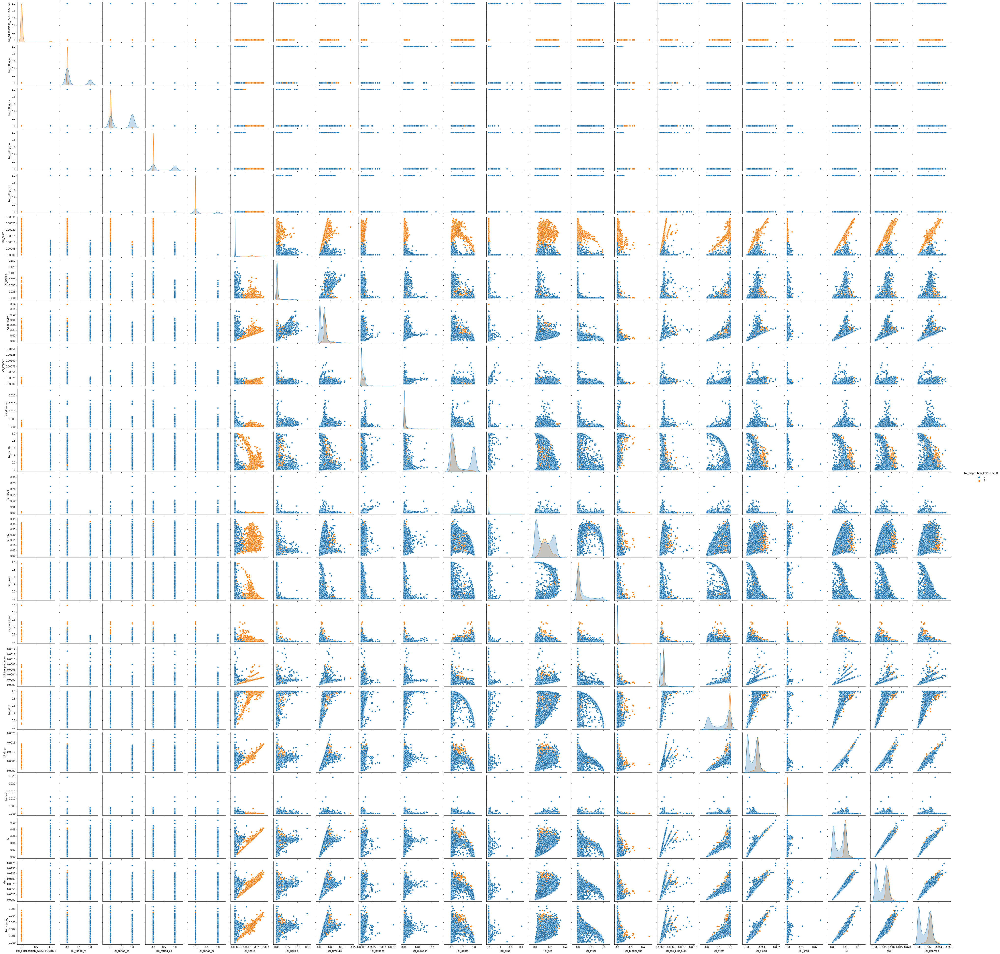

In [34]:
# Pairplot of dataset after noramalizing numerical data and without 'CANDIDATES'
sns.pairplot(df_train_test, hue='koi_disposition_CONFIRMED')
plt.show()

Even after normalization, "koi_score" is a very definitive delineator of "CONFIRMED" and "FALSE POSITIVE" exoplanets. The "CONFIRMED" and "FALSE POSITIVE" are heavily split when pairing "koi_score" with different columns. That could not be said with other columns. The two categories are heavily meshed with one another.

However, considering that there are two very distinct distributions within the "FALSE POSITIVE" bodies, we could theorize that they were two distinct classes to begin with. One that's "exoplanet-like" as shown above with one of the distributions overlapping with the "CONFIRMED" exoplanets, and one that's clearly not an exoplanet.

Nevertheless, in this project, we're simply interested in actual exoplanets. So we move on to see a correlation map of the different columns.

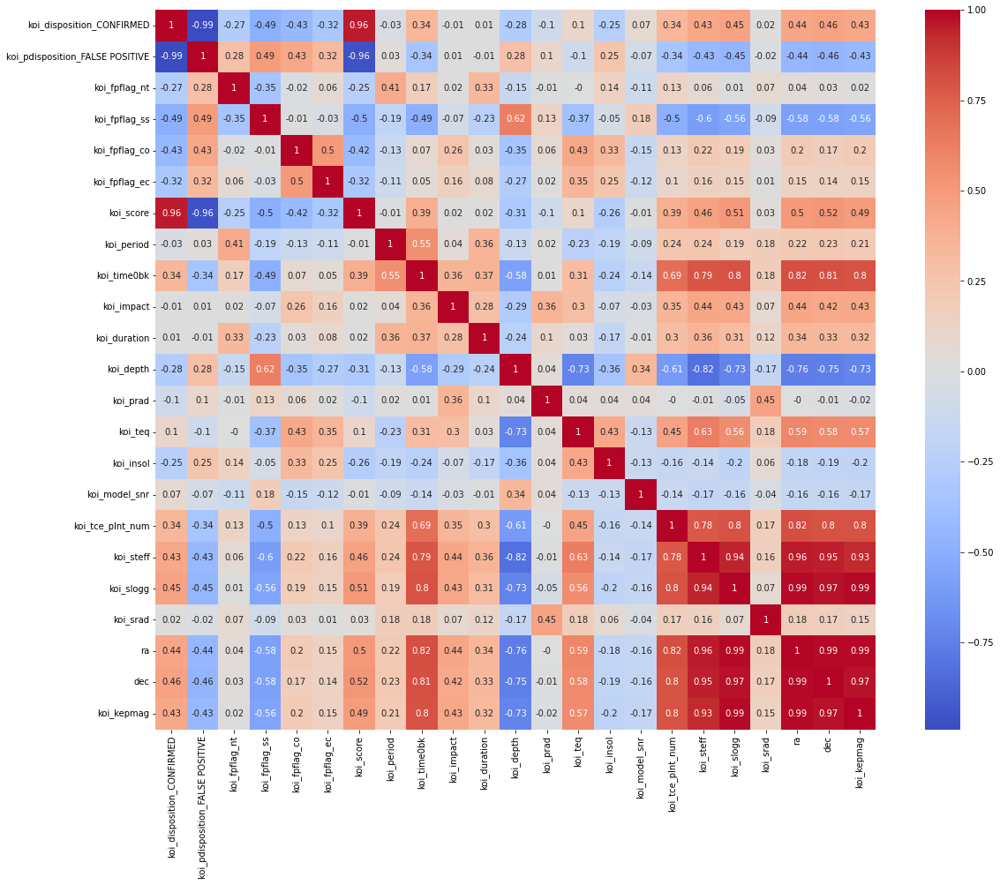

In [35]:
# Checking correlation between columns
plt.figure(figsize=(20,15))
sns.heatmap(round(df_train_test.corr(), 2), cmap='coolwarm', annot=True, square=True)
plt.show()

From the heatamp above, we could see how well correlate each column is with one another. One area of note is located at the lower right, which is highly correlated with one another. Even including "koi_score" is somewhat correlated to them. However, when factoring in 'koi_disposition_CONFIRMED', the correlation is less apparent.

Thus, we can conclude that these columns might have some influence on "koi_score", but not enough to confirm whether or not a stellar object of interest is an exoplanet.

In [37]:
# Checking features with a +/- correlation above 0.5
above_05 = np.abs(df_train_test.corr()['koi_disposition_CONFIRMED']) > 0.5

df_train_test.corr()[above_05]['koi_disposition_CONFIRMED']

koi_disposition_CONFIRMED          1.000000
koi_pdisposition_FALSE POSITIVE   -0.988413
koi_score                          0.955227
Name: koi_disposition_CONFIRMED, dtype: float64

Outside of "koi_score", having a "FALSE POSITIVE" "koi_pdisposition" similarly helps delinates "CONFIRMED" and "FALSE POSITIVES". We'll use these two columns to train our classifiers.

In [38]:
# We'll use these high correlation features for our predictive model
columns_of_interest = ['koi_pdisposition_FALSE POSITIVE', 'koi_score']

X = df_train_test[columns_of_interest]
y = df_train_test['koi_disposition_CONFIRMED']

For our models, we'll use a 80:20 train/test split.

In [39]:
# Splitting our dataset for training and testing using train_test_split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X.values, y.values, test_size=0.2, random_state=7)

For our classifiers, we'll try out 5 different models: Logistic Regression, Random Forest, Support Vector Machines, Gradient Boosting, and K-nearest neighbors. Each classifier will also have their hyperparameters fine-tuned using GridSearchCV. We'll also use the default value for cross-validation in GridSearchCV (which is a 5-fold cross-validation). The best parameters will be used for testing.

In [50]:
# Importing models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier

# Importing tuning methods for hyperparameters
from sklearn.model_selection import GridSearchCV

# Importing metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report

In [48]:
# Initalizing test models
logreg = LogisticRegression(random_state=7)
randfor = RandomForestClassifier(random_state=7)
svm = SVC(random_state=7)
gradboost = GradientBoostingClassifier(random_state=7)
knn = KNeighborsClassifier()

In [49]:
# Hyperparameter space for logreg
logreg_C = [100, 10, 1.0, 0.1, 0.01]
logreg_solver = ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
logreg_params = {'C':logreg_C,'solver':logreg_solver}

# Searching for optimal hyperparameters
logreg_CV = GridSearchCV(logreg, logreg_params, scoring='accuracy', return_train_score=True)
logreg_CV.fit(X_train, y_train)
print(logreg_CV.best_params_)
print(logreg_CV.best_score_)

{'C': 100, 'solver': 'newton-cg'}
0.9956007789365262


                precision    recall  f1-score   support

FALSE POSITIVE       0.99      1.00      1.00       771
     CONFIRMED       1.00      0.98      0.99       309

      accuracy                           0.99      1080
     macro avg       1.00      0.99      0.99      1080
  weighted avg       0.99      0.99      0.99      1080

Test Accuracy: 99.35%


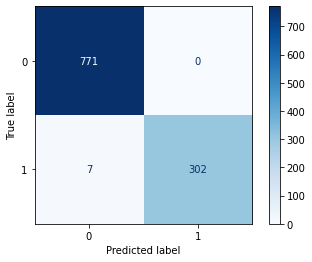

In [67]:
# Loading best parameters
logreg = LogisticRegression(C=100, solver='newton-cg', random_state=7)

# Fitting model
logreg.fit(X_train, y_train)

# Testing model
y_pred = logreg.predict(X_test)

# Measuring model performance
cm = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(cm).plot(cmap='Blues')

target_names=["FALSE POSITIVE", "CONFIRMED"]
print(classification_report(y_test, y_pred, target_names=target_names))
print("Test Accuracy: {:.2%}".format(accuracy_score(y_test, y_pred)))

In [60]:
# Hyperparameter space for randfor
randfor_n_est = [n for n in range(100, 501, 100)]
randfor_crit = ['entropy', 'gini']
randfor_max_depth = [depth for depth in range(2, 6)]
randfor_params = {'n_estimators':randfor_n_est, 'criterion':randfor_crit, 'max_depth':randfor_max_depth}

# Searching for optimal hyperparameters
randfor_CV = GridSearchCV(randfor, randfor_params, scoring='accuracy', return_train_score=True)
randfor_CV.fit(X_train, y_train)
print(randfor_CV.best_params_)
print(randfor_CV.best_score_)

{'criterion': 'entropy', 'max_depth': 2, 'n_estimators': 100}
0.9956007789365262


                precision    recall  f1-score   support

FALSE POSITIVE       0.99      1.00      1.00       771
     CONFIRMED       1.00      0.98      0.99       309

      accuracy                           0.99      1080
     macro avg       1.00      0.99      0.99      1080
  weighted avg       0.99      0.99      0.99      1080

Test Accuracy: 99.35%


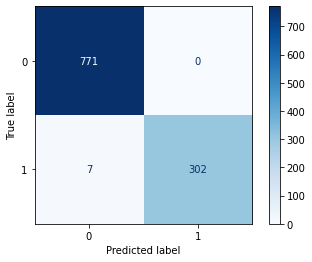

In [68]:
# Loading best parameters
randfor = RandomForestClassifier(n_estimators=100, criterion='entropy', max_depth=2, random_state=7)

# Fitting model
randfor.fit(X_train, y_train)

# Testing model
y_pred = randfor.predict(X_test)

# Measuring model performance
cm = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(cm).plot(cmap='Blues')

target_names=["FALSE POSITIVE", "CONFIRMED"]
print(classification_report(y_test, y_pred, target_names=target_names))
print("Test Accuracy: {:.2%}".format(accuracy_score(y_test, y_pred)))

In [69]:
# Hyperparameter space for svm
svm_kernel = ['linear', 'poly', 'rbf', 'sigmoid']
svm_C = [100, 10, 1.0, 0.1, 0.01]
svm_params = {'kernel':svm_kernel, 'C':svm_C}

# Searching for optimal hyperparameters
svm_CV = GridSearchCV(svm, svm_params, scoring='accuracy', return_train_score=True)
svm_CV.fit(X_train, y_train)
print(svm_CV.best_params_)
print(svm_CV.best_score_)

{'C': 100, 'kernel': 'linear'}
0.9956007789365262


                precision    recall  f1-score   support

FALSE POSITIVE       0.99      1.00      1.00       771
     CONFIRMED       1.00      0.98      0.99       309

      accuracy                           0.99      1080
     macro avg       1.00      0.99      0.99      1080
  weighted avg       0.99      0.99      0.99      1080

Test Accuracy: 99.35%


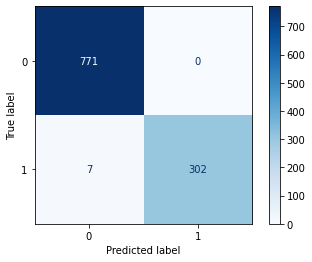

In [70]:
# Loading best parameters
svm = SVC(kernel='linear', C=100, random_state=7)

# Fitting model
svm.fit(X_train, y_train)

# Testing model
y_pred = svm.predict(X_test)

# Measuring model performance
cm = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(cm).plot(cmap='Blues')

target_names=["FALSE POSITIVE", "CONFIRMED"]
print(classification_report(y_test, y_pred, target_names=target_names))
print("Test Accuracy: {:.2%}".format(accuracy_score(y_test, y_pred)))

In [71]:
# Hyperparameter space for gradboost
gradboost_learn_rate = [0.001, 0.01, 0.1]
gradboost_n_est = [n for n in range(100, 501, 100)]
gradboost_max_depth = [depth for depth in range(2, 6)]
gradboost_params = {'learning_rate':gradboost_learn_rate, 'n_estimators':gradboost_n_est, 'max_depth':gradboost_max_depth}

# Searching for optimal hyperparameters
gradboost_CV = GridSearchCV(gradboost, gradboost_params, scoring='accuracy', return_train_score=True)
gradboost_CV.fit(X_train, y_train)
print(gradboost_CV.best_params_)
print(gradboost_CV.best_score_)

{'learning_rate': 0.001, 'max_depth': 2, 'n_estimators': 400}
0.9956007789365262


                precision    recall  f1-score   support

FALSE POSITIVE       0.99      1.00      1.00       771
     CONFIRMED       1.00      0.98      0.99       309

      accuracy                           0.99      1080
     macro avg       1.00      0.99      0.99      1080
  weighted avg       0.99      0.99      0.99      1080

Test Accuracy: 99.35%


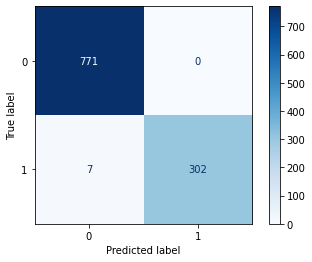

In [72]:
# Loading best parameters
gradboost = GradientBoostingClassifier(learning_rate=0.001, n_estimators=400, max_depth=2, random_state=7)

# Fitting model
gradboost.fit(X_train, y_train)

# Testing model
y_pred = gradboost.predict(X_test)

# Measuring model performance
cm = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(cm).plot(cmap='Blues')

target_names=["FALSE POSITIVE", "CONFIRMED"]
print(classification_report(y_test, y_pred, target_names=target_names))
print("Test Accuracy: {:.2%}".format(accuracy_score(y_test, y_pred)))

In [73]:
# Hyperparameter space for gradboost
knn_neighbors = [neighbors for neighbors in range(1, 21)]
knn_metric = ['euclidean', 'manhattan', 'minkowski']
knn_params = {'n_neighbors':knn_neighbors, 'metric':knn_metric}

# Searching for optimal hyperparameters
knn_CV = GridSearchCV(knn, knn_params, scoring='accuracy', return_train_score=True)
knn_CV.fit(X_train, y_train)
print(knn_CV.best_params_)
print(knn_CV.best_score_)

{'metric': 'euclidean', 'n_neighbors': 2}
0.9956007789365262


                precision    recall  f1-score   support

FALSE POSITIVE       0.99      1.00      1.00       771
     CONFIRMED       1.00      0.98      0.99       309

      accuracy                           0.99      1080
     macro avg       1.00      0.99      0.99      1080
  weighted avg       0.99      0.99      0.99      1080

Test Accuracy: 99.35%


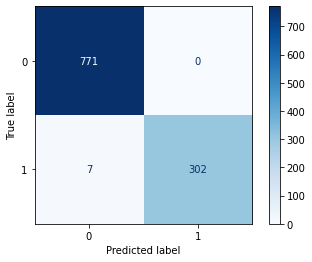

In [74]:
# Loading best parameters
knn = KNeighborsClassifier(n_neighbors=2, metric='euclidean')

# Fitting model
knn.fit(X_train, y_train)

# Testing model
y_pred = knn.predict(X_test)

# Measuring model performance
cm = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(cm).plot(cmap='Blues')

target_names=["FALSE POSITIVE", "CONFIRMED"]
print(classification_report(y_test, y_pred, target_names=target_names))
print("Test Accuracy: {:.2%}".format(accuracy_score(y_test, y_pred)))

Interestingly, the all provide the same performance. The number of misidentified exoplanets are the same. Thus, we'll use the simplest model as our exoplanet classifier and predictor (a Logistic Regression) as they are much easier to train and interpret, if needed.

From our model, we'll predict which stellar objects of interest are exoplanets.

In [96]:
# Loading best parameters for Logistic Regression
logreg = LogisticRegression(C=100, solver='newton-cg', random_state=7)

# Fitting model
logreg.fit(X_train, y_train)

# Using model to predict candidates
y_pred_train_test = logreg.predict(df_train_test[columns_of_interest].values)
y_pred_cand = logreg.predict(df_cand[columns_of_interest].values)

In [97]:
unique, counts = np.unique(y_pred_train_test, return_counts=True)
dict(zip(unique, counts))

{0: 3836, 1: 1562}

In [98]:
unique, counts = np.unique(y_pred_cand, return_counts=True)
dict(zip(unique, counts))

{1: 1471}

Although our model does have a test accuracy of 99.35%, it is still just a model. From our observation earlier with the pairplots, there are very "exoplanet-like" objects out there and their physical characteristics (at least from those found in this dataset) are very similar to that of "CONFIRMED" exoplanets. Thus, the likelihood that there are "FALSE POSITIVE" bodies within the 1471 candidates remains non-zero.

From a non-expert's perspective, it would be interesting to know what the "exoplanet-like" object is. 